In [35]:
import numpy as np
import pandas as pd
import yfinance as yf
from ta.trend import MACD
import gym
from gym import spaces
import matplotlib.pyplot as plt
import math

def calculate_obv(df):
        obv = [0] * len(df)
        for i in range(1, len(df)):
            if df['Close'][i] > df['Close'][i - 1]:
                obv[i] = obv[i - 1] + df['Volume'][i]
            elif df['Close'][i] < df['Close'][i - 1]:
                obv[i] = obv[i - 1] - df['Volume'][i]
            else:
                obv[i] = obv[i - 1]
        return np.array(obv)

ticker= 'AAPL'
start='2021-11-01'
end='2023-01-01'
real_start = '2022-01-01'
data = yf.download(ticker, start=start, end=end).reset_index()
data['macd'] = MACD(data['Close']).macd()
data['obv'] = calculate_obv(data)
data['price_next_day'] = data.loc[1:,'Open'].reset_index(drop = True)
data = data[(data['Date'] >= real_start) & ~(data['price_next_day'].isna())].reset_index(drop = True)

[*********************100%%**********************]  1 of 1 completed


In [36]:
data

,Date,Open,High,Low,Close,Adj Close,Volume,macd,obv,price_next_day
43,2022-01-03,177.830002,182.880005,177.710007,182.009995,179.481125,104487900,4.754108,639664300,182.630005
44,2022-01-04,182.630005,182.940002,179.119995,179.699997,177.203201,99310400,4.612743,540353900,179.610001
45,2022-01-05,179.610001,180.169998,174.639999,174.919998,172.489639,94537600,4.068109,445816300,172.699997
46,2022-01-06,172.699997,175.300003,171.639999,172.000000,169.610214,96904000,3.362107,348912300,172.889999
47,2022-01-07,172.889999,174.139999,171.029999,172.169998,169.777847,86709100,2.784219,435621400,169.080002
...,...,...,...,...,...,...,...,...,...,...
288,2022-12-22,134.350006,134.559998,130.300003,132.229996,131.149521,77852100,-3.464708,-768508400,130.919998
289,2022-12-23,130.919998,132.419998,129.639999,131.860001,130.782578,63814900,-3.670694,-832323300,131.380005
290,2022-12-27,131.380005,131.410004,128.720001,130.029999,128.967499,69007800,-3.936230,-901331100,129.669998
291,2022-12-28,129.669998,131.029999,125.870003,126.040001,125.010132,85438400,-4.417705,-986769500,127.989998


In [34]:
data

,Date,Open,High,Low,Close,Adj Close,Volume,macd,obv,price_next_day
0,2021-11-01,148.990005,149.699997,147.800003,148.960007,146.676270,74588300,NaN,0,148.660004
1,2021-11-02,148.660004,151.570007,148.649994,150.020004,147.720016,69122000,NaN,69122000,150.389999
2,2021-11-03,150.389999,151.970001,149.820007,151.490005,149.167465,54511500,NaN,123633500,151.580002
3,2021-11-04,151.580002,152.429993,150.639999,150.960007,148.645615,60394600,NaN,63238900,151.889999
4,2021-11-05,151.889999,152.199997,150.059998,151.279999,149.178085,65463900,NaN,128702800,151.410004
...,...,...,...,...,...,...,...,...,...,...
289,2022-12-23,130.919998,132.419998,129.639999,131.860001,130.782578,63814900,-3.670694,-832323300,131.380005
290,2022-12-27,131.380005,131.410004,128.720001,130.029999,128.967499,69007800,-3.936230,-901331100,129.669998
291,2022-12-28,129.669998,131.029999,125.870003,126.040001,125.010132,85438400,-4.417705,-986769500,127.989998
292,2022-12-29,127.989998,130.479996,127.730003,129.610001,128.550934,75703700,-4.459798,-911065800,128.410004


In [32]:
data.loc[1:,'Open'].reset_index(drop = True)

0      148.660004
1      150.389999
2      151.580002
3      151.889999
4      151.410004
          ...    
288    130.919998
289    131.380005
290    129.669998
291    127.989998
292    128.410004
Name: Open, Length: 293, dtype: float64

In [38]:
import numpy as np
import pandas as pd
import yfinance as yf
from ta.trend import MACD
import gym
from gym import spaces
import matplotlib.pyplot as plt
# import mplfinance as mpf
import math

class StockTradingEnv(gym.Env):
    def __init__(self, ticker='TSLA', start='2022-01-01', end='2023-01-01'):
        self.data = yf.download(ticker, start=start, end=end).reset_index()
        self.observation_space = spaces.Box(low=-np.inf, high=np.inf, shape=(4,))
        self.action_space = spaces.Discrete(3)
        self.max_steps = len(self.data) - 1
        self.macd = MACD(self.data['Close']).macd()
        # self.macd_signal = MACD(self.data['Close']).macd_signal()
        # self.macd_diff = MACD(self.data['Close']).macd_diff()
        self.obv = self.calculate_obv()
        self.reset()

    def reset(self):
        self.current_step = 0
        self.balance = 10000
        self.shares_owned = 0
        self.net_worth = self.balance
        self.max_net_worth = self.balance
        return self._next_observation()

    def _next_observation(self):
        obs = np.array([
            self.data['Close'][self.current_step],
            # self.data['Low'][self.current_step],
            self.data['Volume'][self.current_step],
            self.macd[self.current_step],
            # self.macd_signal[self.current_step],
            # self.macd_diff[self.current_step],
            self.obv[self.current_step]
        ])
        return obs

    def step(self, action):
        assert self.action_space.contains(action)
        
        prev_net_worth = self.net_worth
        print(f"Date: {self.data['Date'][self.current_step]}")
        if action == 0:  # Sell
            if self.shares_owned > 0:
                self.balance += self.data['Close'][self.current_step] * self.shares_owned
                self.shares_owned = 0
                print(f"Sell at {self.data['Close'][self.current_step]}")
        
        elif action == 2:  # Buy
            if self.balance >= self.data['Close'][self.current_step]:
                share_buy = math.floor(self.balance / self.data['Close'][self.current_step])
                self.shares_owned += share_buy
                self.balance -= self.data['Close'][self.current_step] * share_buy
                print(f"Buy at {self.data['Close'][self.current_step]} * {share_buy}")
                
        print(f"Balance {self.balance}")
        print(f"Share owend {self.shares_owned}")
        
        self.net_worth = self.balance + (self.shares_owned * self.data['Close'][self.current_step])
        self.max_net_worth = max(self.max_net_worth, self.net_worth)
        
        self.current_step += 1
        
        done = self.current_step > self.max_steps
        
        if not done:
            obs = self._next_observation()
        else:
            obs = np.zeros_like(self.observation_space.low)
        
        reward = self.net_worth - prev_net_worth
        return obs, reward, done, {}

    def calculate_obv(self):
        obv = [0] * len(self.data)
        for i in range(1, len(self.data)):
            if self.data['Close'][i] > self.data['Close'][i - 1]:
                obv[i] = obv[i - 1] + self.data['Volume'][i]
            elif self.data['Close'][i] < self.data['Close'][i - 1]:
                obv[i] = obv[i - 1] - self.data['Volume'][i]
            else:
                obv[i] = obv[i - 1]
        return np.array(obv)
    
# def render(self):
#         df = self.data.copy()
#         df['Buy'] = np.nan
#         df['Sell'] = np.nan
        
#         for step, action in self.buy_sell_actions:
#             if action == 'Buy':
#                 df.at[df.index[step], 'Buy'] = df['Close'][step]
#             elif action == 'Sell':
#                 df.at[df.index[step], 'Sell'] = df['Close'][step]
        
#         ap0 = [
#             # mpf.make_addplot(df['MACD'], panel=1, color='g', title="MACD"),
#             # mpf.make_addplot(df['MACD_Signal'], panel=1, color='r'),
#             # mpf.make_addplot(df['MACD_Diff'], panel=1, color='b'),
#             mpf.make_addplot(df['Buy'], type='scatter', marker='^', color='g', markersize=100, panel=0),
#             mpf.make_addplot(df['Sell'], type='scatter', marker='v', color='r', markersize=100, panel=0)
#         ]
        
#         df
        
#         mpf.plot(df, type='candle', style='charles', addplot=ap0, volume=True)

class QLearningAgent:
    def __init__(self, env, learning_rate=0.1, discount_factor=0.99, exploration_rate=1.0, exploration_decay_rate=0.995):
        self.env = env
        self.learning_rate = learning_rate
        self.discount_factor = discount_factor
        self.exploration_rate = exploration_rate
        self.exploration_decay_rate = exploration_decay_rate
        self.q_table = np.zeros((10, 10, 10, 10, env.action_space.n))

    def _discretize_state(self, state):
        state_bounds = [
            (self.env.data['Close'].min(), self.env.data['Close'].max()),
            (self.env.data['Volume'].min(), self.env.data['Volume'].max()),
            (np.nanmin(self.env.macd), np.nanmax(self.env.macd)),
            (self.env.obv.min(), self.env.obv.max())
        ]
        discrete_state = []
        state = np.nan_to_num(state)  # Replace NaNs with 0
        for i in range(len(state)):
            if state_bounds[i][0] == state_bounds[i][1]:
                discrete_state.append(0)
            else:
                scaled_value = (state[i] - state_bounds[i][0]) / (state_bounds[i][1] - state_bounds[i][0])
                discrete_value = int(np.clip(scaled_value * (self.q_table.shape[i] - 1), 0, self.q_table.shape[i] - 1))
                discrete_state.append(discrete_value)
        return tuple(discrete_state)

    def choose_action(self, state):
        discrete_state = self._discretize_state(state)
        if np.random.rand() < self.exploration_rate:
            return self.env.action_space.sample()
        else:
            return np.argmax(self.q_table[discrete_state])

    def update_q_table(self, state, action, reward, next_state):
        state_index = self._discretize_state(state)
        next_state_index = self._discretize_state(next_state)
        q_value = self.q_table[state_index][action]
        max_next_q_value = np.max(self.q_table[next_state_index])
        
        new_q_value = (1 - self.learning_rate) * q_value + self.learning_rate * (reward + self.discount_factor * max_next_q_value)
        self.q_table[state_index][action] = new_q_value

    def decay_exploration_rate(self):
        if self.exploration_rate > 0.01:
            self.exploration_rate *= self.exploration_decay_rate

def train_and_validate(ticker, start, end, num_episodes=365):
    env = StockTradingEnv(ticker=ticker, start=start, end=end)
    agent = QLearningAgent(env)
    env
    # episode_rewards = []
    # for episode in range(num_episodes):
    #     state = env.reset()
    #     episode_reward = 0
        
    #     while True:
    #         action = agent.choose_action(state)
    #         next_state, reward, done, _ = env.step(action)
    #         agent.update_q_table(state, action, reward, next_state)
    #         state = next_state
    #         episode_reward += reward
    #         if done:
    #             break
        
    #     agent.decay_exploration_rate()
    #     episode_rewards.append(episode_reward)
    #     print(f"Episode {episode + 1}/{num_episodes}, Reward: {episode_reward}")

    # final_net_worth = agent.env.net_worth
    # initial_balance = 10000
    # cumulative_return = (final_net_worth - initial_balance) / initial_balance * 100
    # print(f"Final Net Worth: {final_net_worth}")
    # print(f"Cumulative Return: {cumulative_return:.2f}%")

    # plt.plot(episode_rewards)
    # plt.xlabel('Episode')
    # plt.ylabel('Reward')
    # plt.title('Episode Rewards')
    # plt.grid(True)
    # plt.show()

    # env.render()

In [40]:
ticker = 'AAPL'
start_date = '2023-01-01'
end_date = '2024-01-01'
train_and_validate(ticker, start_date, end_date, num_episodes=365)

[*********************100%%**********************]  1 of 1 completed


[*********************100%%**********************]  1 of 1 completed


Date: 2023-01-03 00:00:00
Buy at 125.06999969482422 * 79
Balance 119.47002410888672
Share owend 79
Date: 2023-01-04 00:00:00
Sell at 126.36000061035156
Balance 10101.91007232666
Share owend 0
Date: 2023-01-05 00:00:00
Buy at 125.0199966430664 * 80
Balance 100.31034088134766
Share owend 80
Date: 2023-01-06 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-09 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-10 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-11 00:00:00
Balance 100.31034088134766
Share owend 80
Date: 2023-01-12 00:00:00
Sell at 133.41000366210938
Balance 10773.110633850098
Share owend 0
Date: 2023-01-13 00:00:00
Buy at 134.75999450683594 * 79
Balance 127.0710678100586
Share owend 79
Date: 2023-01-17 00:00:00
Sell at 135.94000244140625
Balance 10866.331260681152
Share owend 0
Date: 2023-01-18 00:00:00
Balance 10866.331260681152
Share owend 0
Date: 2023-01-19 00:00:00
Balance 10866.331260681152
Share owend 0
Date: 2023-01-20 0

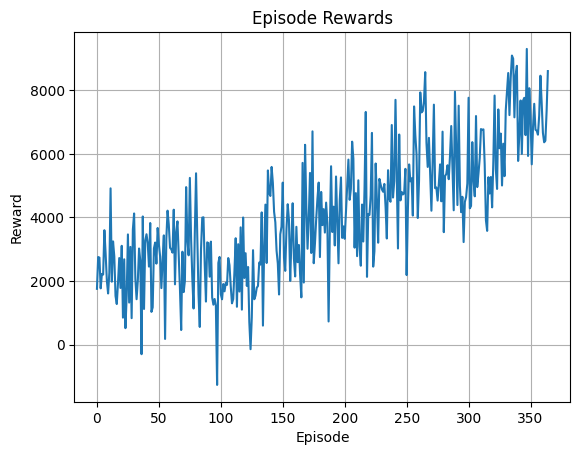

In [118]:
ticker = 'AAPL'
start_date = '2023-01-01'
end_date = '2024-01-01'
train_and_validate(ticker, start_date, end_date, num_episodes=365)